In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from imblearn.under_sampling import NearMiss
from sklearn.ensemble import ExtraTreesClassifier 
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression 
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
import plotly.express as pl
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
import xgboost 
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc, r2_score

In [2]:
df=pd.read_excel('C:\\Users\\bchal\\OneDrive\\Documents\\-Apprentissage supervisé\\pfa1\\Heart Disease.xlsx')
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3,30,No,Female,55-59,White,Yes,Yes,Very good,5,Yes,No,Yes
1,No,20.34,No,No,Yes,0,0,No,Female,80 or older,White,No,Yes,Very good,7,No,No,No
2,No,26.58,Yes,No,No,20,30,No,Male,65-69,White,Yes,Yes,Fair,8,Yes,No,No
3,No,24.21,No,No,No,0,0,No,Female,75-79,White,No,No,Good,6,No,No,Yes
4,No,23.71,No,No,No,28,0,Yes,Female,40-44,White,No,Yes,Very good,8,No,No,No


In [3]:
df.shape

(319795, 18)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  int64  
 6   MentalHealth      319795 non-null  int64  
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  int64  
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [5]:
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

<Axes: xlabel='Smoking', ylabel='count'>

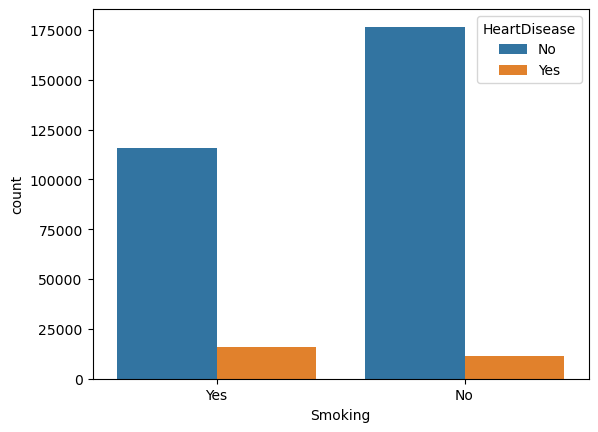

In [6]:
#sns.countplot(df.HeartDisease)
sns.countplot(x='Smoking',hue='HeartDisease',data=df)

In [7]:
data = df[df['HeartDisease']=='Yes']
data

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
5,Yes,28.87,Yes,No,No,6,0,Yes,Female,75-79,Black,No,No,Fair,12,No,No,No
10,Yes,34.30,Yes,No,No,30,0,Yes,Male,60-64,White,Yes,No,Poor,15,Yes,No,No
35,Yes,32.98,Yes,No,Yes,10,0,Yes,Male,75-79,White,Yes,Yes,Poor,4,No,No,Yes
42,Yes,25.06,No,No,No,0,0,Yes,Female,80 or older,White,Yes,No,Good,7,No,No,Yes
43,Yes,30.23,Yes,No,No,6,2,Yes,Female,75-79,White,Yes,Yes,Fair,8,No,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319765,Yes,38.45,No,No,Yes,30,15,Yes,Female,55-59,Hispanic,Yes,Yes,Poor,6,Yes,No,No
319767,Yes,36.21,Yes,No,No,0,0,Yes,Female,75-79,Hispanic,Yes,Yes,Good,8,No,No,No
319781,Yes,37.12,Yes,No,No,0,0,No,Male,35-39,Hispanic,No,Yes,Very good,7,No,No,No
319786,Yes,33.20,Yes,No,No,0,0,No,Female,60-64,Hispanic,Yes,Yes,Very good,8,Yes,No,No


In [8]:
smoke=data['Smoking'].value_counts()
smoke

Smoking
Yes    16037
No     11336
Name: count, dtype: int64

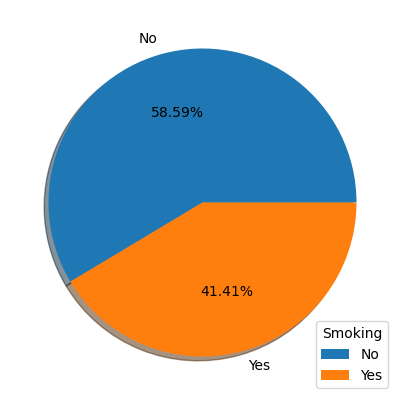

In [9]:
labels=["No",'Yes']
plt.figure(figsize=(5,5))
plt.pie(smoke,labels=labels,autopct='%2.2f%%',shadow=True)#autopct enables you to display the percent value using Python string formatting
plt.legend(title='Smoking',loc='lower right')
plt.show()

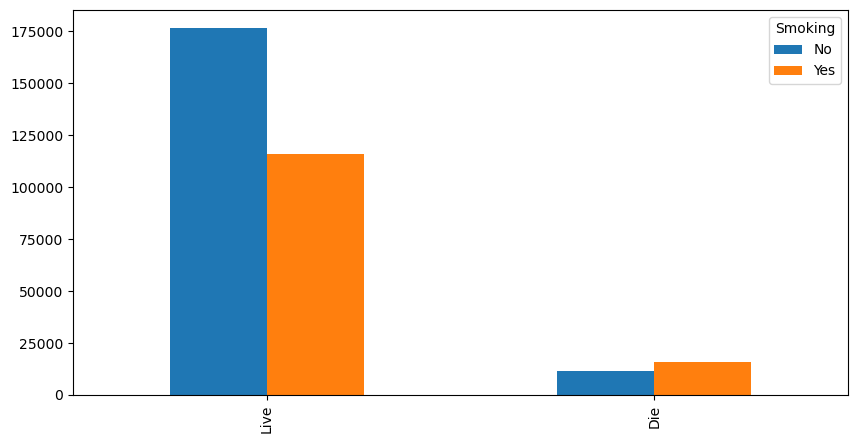

In [10]:
def  bar_chart(feature):
    live=df[df['HeartDisease']=='No'][feature].value_counts()
    die=df[df['HeartDisease']=='Yes'][feature].value_counts()
    df1=pd.DataFrame([live,die])
    df1.index=['Live','Die']
    df1.plot(kind='bar',figsize=(10,5))
bar_chart('Smoking')

<Axes: xlabel='BMI', ylabel='Density'>

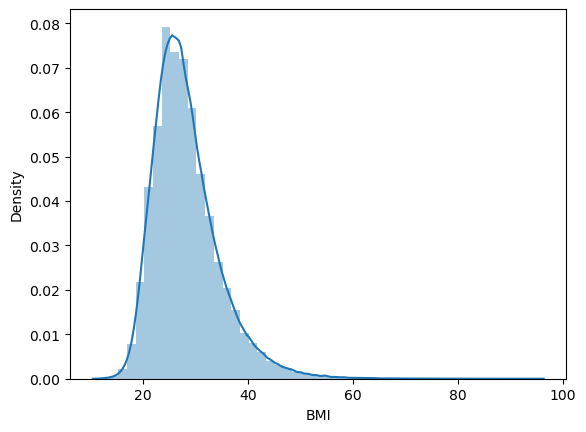

In [11]:
sns.distplot(df['BMI']) #A Distplot or distribution plot, depicts the variation in the data distribution.

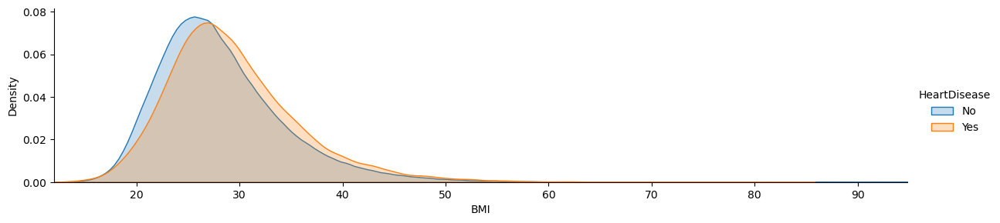

In [12]:
def kde(x):
    facet=sns.FacetGrid(df,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df[x].min(),df[x].max()))#Limits for each of the axes on each facet (only relevant when share{x, y} is True).
    facet.add_legend()
    plt.show()
kde('BMI')


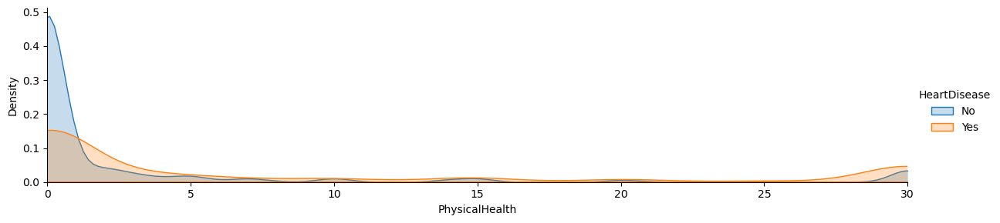

In [13]:
kde('PhysicalHealth')

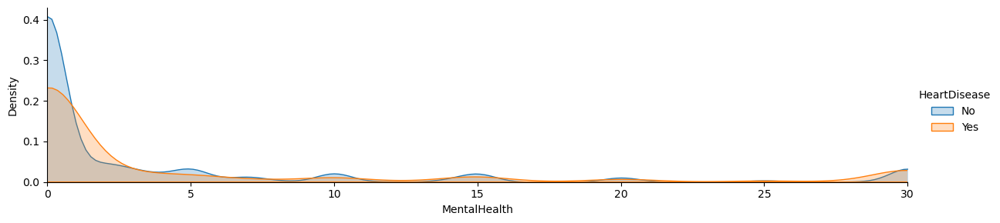

In [14]:
kde('MentalHealth')

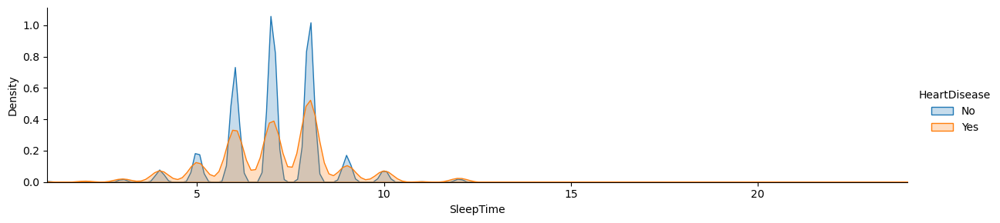

In [15]:
kde('SleepTime')


AlcoholDrinking
No     26232
Yes     1141
Name: count, dtype: int64

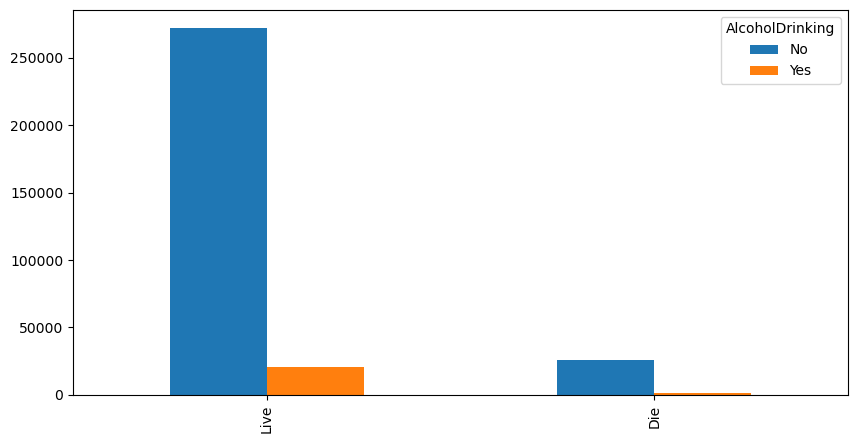

In [16]:
bar_chart('AlcoholDrinking')
AlcoholDrinking=data['AlcoholDrinking'].value_counts()
AlcoholDrinking

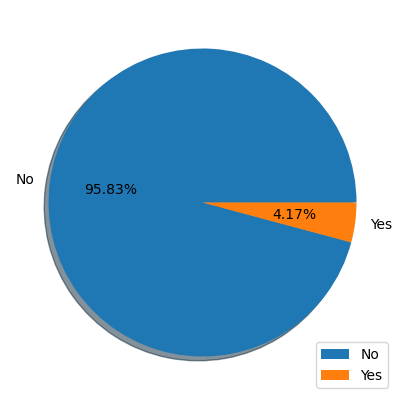

In [17]:
plt.figure(figsize=(5,5))
plt.pie(AlcoholDrinking,labels=labels,autopct='%2.2f%%',shadow=True)#autopct enables you to display the percent value using Python string formatting
plt.legend(title='',loc='lower right')
plt.show()

Stroke
No     22984
Yes     4389
Name: count, dtype: int64

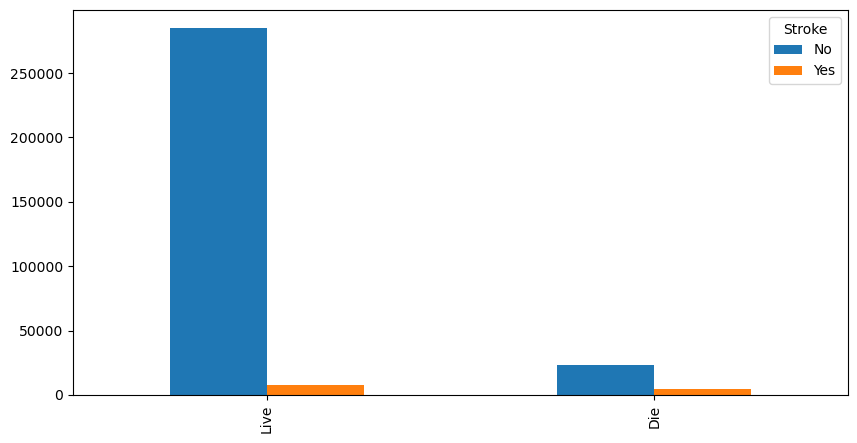

In [18]:
bar_chart('Stroke')
Stroke=data['Stroke'].value_counts()
Stroke


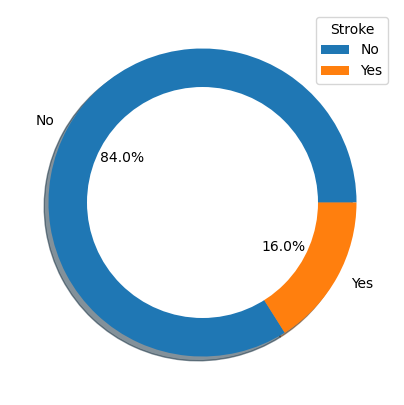

In [19]:
plt.figure(figsize=(5,5))
plt.pie(Stroke,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Stroke',loc='upper right')
plt.show()

DiffWalking
No     17345
Yes    10028
Name: count, dtype: int64

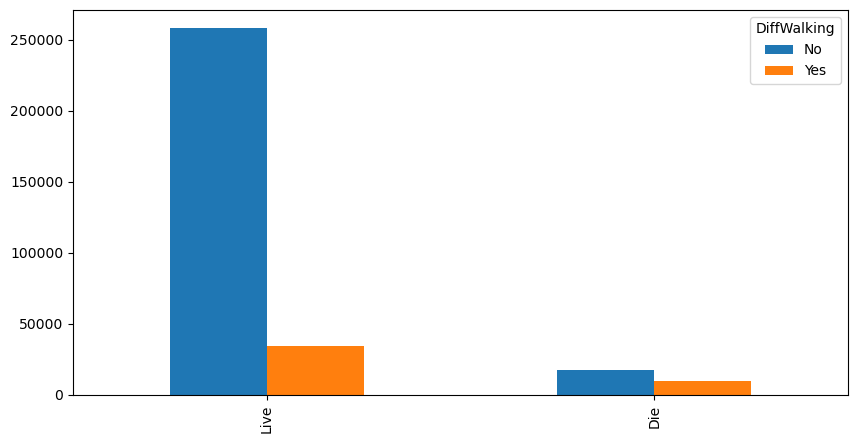

In [20]:
bar_chart('DiffWalking')
DiffWalking=data['DiffWalking'].value_counts()
DiffWalking

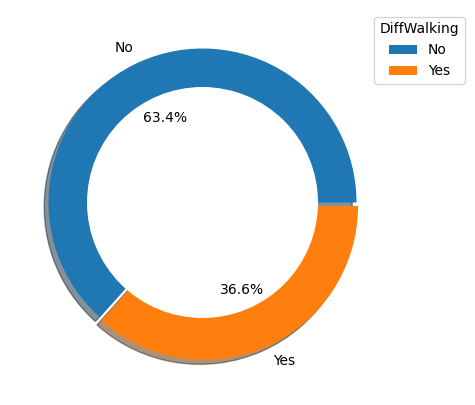

In [21]:
plt.figure(figsize=(5,5))
plt.pie(DiffWalking,labels=labels,explode=[0,0.025] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='DiffWalking',loc='upper right',bbox_to_anchor=(1.2,1))
plt.show()

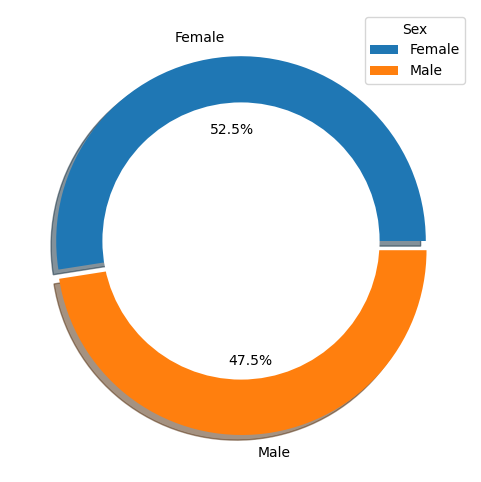

In [22]:
Sex=df['Sex'].value_counts()
Sex
labels=['Female','Male']
plt.figure(figsize=(6,6))
plt.pie(Sex,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Sex',loc='upper right')
plt.show()

In [23]:
Race=df['Race'].value_counts()
Race

Race
White                             245212
Hispanic                           27446
Black                              22939
Other                              10928
Asian                               8068
American Indian/Alaskan Native      5202
Name: count, dtype: int64

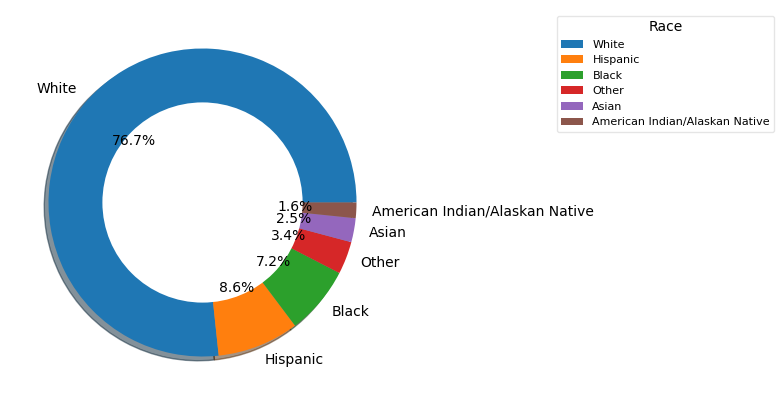

In [24]:
labels=['White','Hispanic','Black','Other','Asian','American Indian/Alaskan Native']
plt.figure(figsize=(5,5))
plt.pie(Race,labels=labels,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.65,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Race',loc='upper right',framealpha=0.5,fontsize=8,bbox_to_anchor=(2,1))
plt.show()

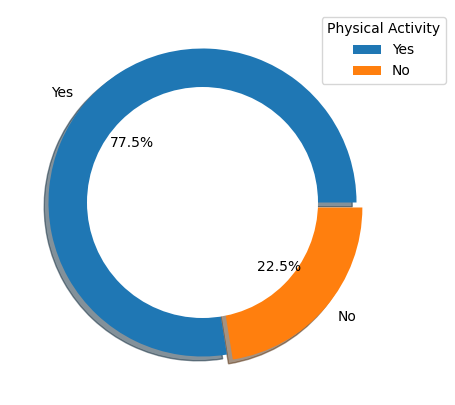

PhysicalActivity
Yes    247957
No      71838
Name: count, dtype: int64

In [25]:
PhysicalActivity=df['PhysicalActivity'].value_counts()

labels=['Yes','No']
plt.figure(figsize=(5,5))
plt.pie(PhysicalActivity,labels=labels,explode=[0,0.05] ,autopct='%2.1f%%',shadow=True)
circle=plt.Circle(xy=(0,0),radius=0.75,facecolor='white')
plt.gca().add_artist(circle)
plt.legend(title='Physical Activity',loc='upper right',bbox_to_anchor=(1.15,1))
plt.show()
PhysicalActivity

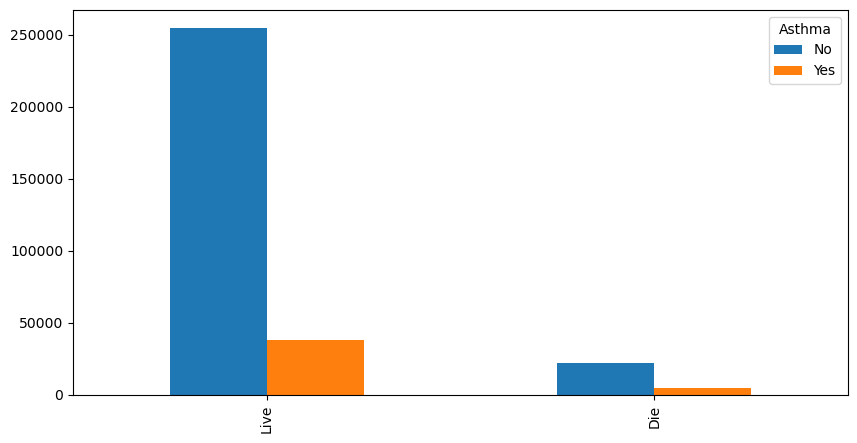

In [26]:
bar_chart('Asthma')

SkinCancer
No     22393
Yes     4980
Name: count, dtype: int64

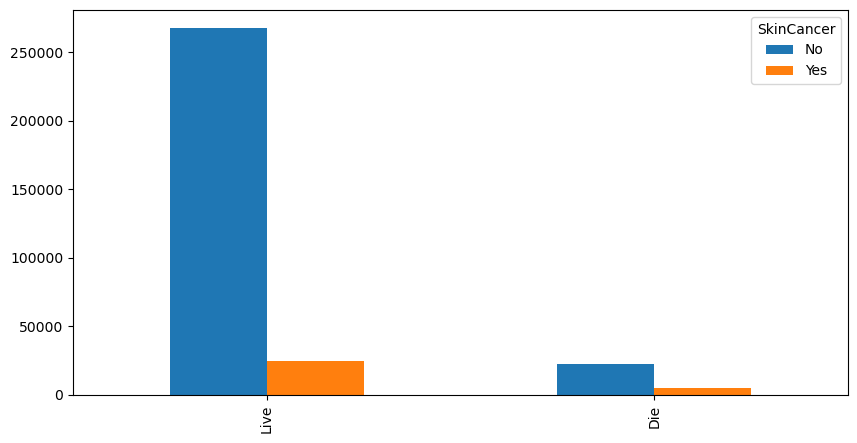

In [27]:
 SkinCancer=data['SkinCancer'].value_counts()
 bar_chart('SkinCancer')
 SkinCancer

Data preprocessing for balancing

In [28]:
le=LabelEncoder()
list=['HeartDisease','Smoking', 'AlcoholDrinking', 'Stroke','DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'Asthma', 'KidneyDisease', 'SkinCancer']
for i in list:
    df[i]=le.fit_transform(df[i])
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3,30,0,0,7,5,2,1,4,5,1,0,1
1,0,20.34,0,0,1,0,0,0,0,12,5,0,1,4,7,0,0,0
2,0,26.58,1,0,0,20,30,0,1,9,5,2,1,1,8,1,0,0
3,0,24.21,0,0,0,0,0,0,0,11,5,0,0,2,6,0,0,1
4,0,23.71,0,0,0,28,0,1,0,4,5,0,1,4,8,0,0,0


In [29]:
x=df.drop(columns=['HeartDisease'])
y=df['HeartDisease']
x.sample(10)

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
98698,22.52,0,0,0,0,3,0,1,5,5,0,1,0,8,0,0,0
94495,27.98,1,0,0,0,10,0,1,2,5,0,1,4,5,0,0,0
131458,19.74,1,0,0,0,3,0,0,9,5,0,1,0,7,0,0,0
281005,38.11,1,0,0,0,0,0,1,4,5,0,1,4,9,0,0,0
289376,21.68,1,0,0,1,3,1,0,12,5,0,0,2,3,0,0,0
259339,37.75,0,0,0,2,30,0,1,4,5,0,1,2,8,0,0,0
59839,26.85,1,0,0,30,0,1,1,10,5,0,0,2,6,0,0,0
221400,42.43,1,0,0,0,0,1,0,8,5,2,0,2,8,1,0,1
173633,27.26,0,0,0,1,5,0,1,5,5,0,1,0,8,0,0,0
212483,35.35,0,0,0,15,0,1,0,12,5,2,0,1,6,0,0,0


Undersampling

In [30]:

NearMiss_obj = NearMiss()
new_x , new_y = NearMiss_obj.fit_resample(x,y)
new_y

0        0
1        0
2        0
3        0
4        0
        ..
54741    1
54742    1
54743    1
54744    1
54745    1
Name: HeartDisease, Length: 54746, dtype: int32

In [31]:
new_y.value_counts()

HeartDisease
0    27373
1    27373
Name: count, dtype: int64

In [32]:
df2=pd.DataFrame(new_x)
df2.head()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0
1,22.24,1,0,0,0,0,0,1,11,5,0,1,4,7,0,0,0
2,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0
3,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0
4,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0


In [33]:
df3=pd.DataFrame(new_y)
df3.head()


,HeartDisease
0,0
1,0
2,0
3,0
4,0


In [34]:
df4=pd.concat([df2,df3],axis=1)
df4

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
0,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0,0
1,22.24,1,0,0,0,0,0,1,11,5,0,1,4,7,0,0,0,0
2,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0,0
3,25.10,0,0,0,0,0,0,1,9,5,0,1,4,7,0,0,0,0
4,26.63,0,0,0,0,0,0,0,12,5,0,1,2,8,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54741,38.45,0,0,1,30,15,1,0,7,3,2,1,3,6,1,0,0,1
54742,36.21,1,0,0,0,0,1,0,11,3,2,1,2,8,0,0,0,1
54743,37.12,1,0,0,0,0,0,1,3,3,0,1,4,7,0,0,0,1
54744,33.20,1,0,0,0,0,0,0,8,3,2,1,4,8,1,0,0,1


Feature ranking

In [35]:
df4.nunique()

BMI                 2267
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             22
Asthma                 2
KidneyDisease          2
SkinCancer             2
HeartDisease           2
dtype: int64

In [36]:

extr = ExtraTreesClassifier()
extr.fit(new_x,new_y)
feature_importance = extr.feature_importances_
feature_importance  

array([0.24196119, 0.00785191, 0.0070519 , 0.04076439, 0.13337567,
       0.08078973, 0.10816551, 0.00614999, 0.03407784, 0.0450624 ,
       0.0720549 , 0.06450646, 0.04940962, 0.03712404, 0.03814069,
       0.02231915, 0.0111946 ])

In [37]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp.head(10)

,Gain_Score
0,0.241961
1,0.007852
2,0.007052
3,0.040764
4,0.133376
5,0.080790
6,0.108166
7,0.006150
8,0.034078
9,0.045062


In [38]:
new_x.columns

Index(['BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth',
       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic',
       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease',
       'SkinCancer'],
      dtype='object')

In [39]:
cols = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
cols.head(10)

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth
5,MentalHealth
6,DiffWalking
7,Sex
8,AgeCategory
9,Race


In [40]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,BMI,0.241961
1,Smoking,0.007852
2,AlcoholDrinking,0.007052
3,Stroke,0.040764
4,PhysicalHealth,0.133376
5,MentalHealth,0.080790
6,DiffWalking,0.108166
7,Sex,0.006150
8,AgeCategory,0.034078
9,Race,0.045062


In [41]:
newx = gains.nlargest(18,'Gain_Score')
newx

,Feature_Names,Gain_Score
0,BMI,0.241961
4,PhysicalHealth,0.133376
6,DiffWalking,0.108166
5,MentalHealth,0.080790
10,Diabetic,0.072055
11,PhysicalActivity,0.064506
12,GenHealth,0.049410
9,Race,0.045062
3,Stroke,0.040764
14,Asthma,0.038141


<Axes: xlabel='Gain_Score', ylabel='Feature_Names'>

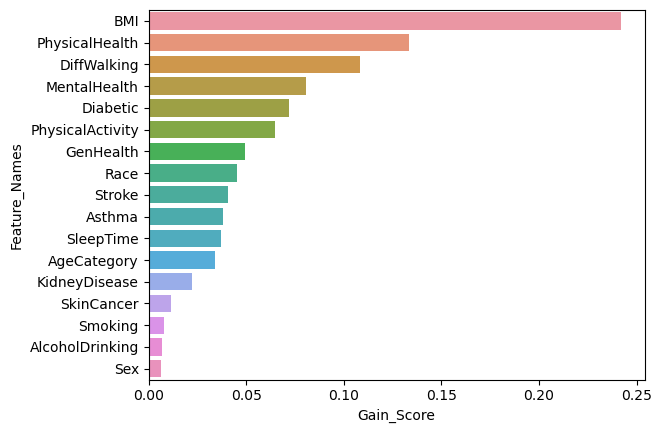

In [42]:
sns.barplot(x='Gain_Score',y='Feature_Names',data=newx)

<Axes: >

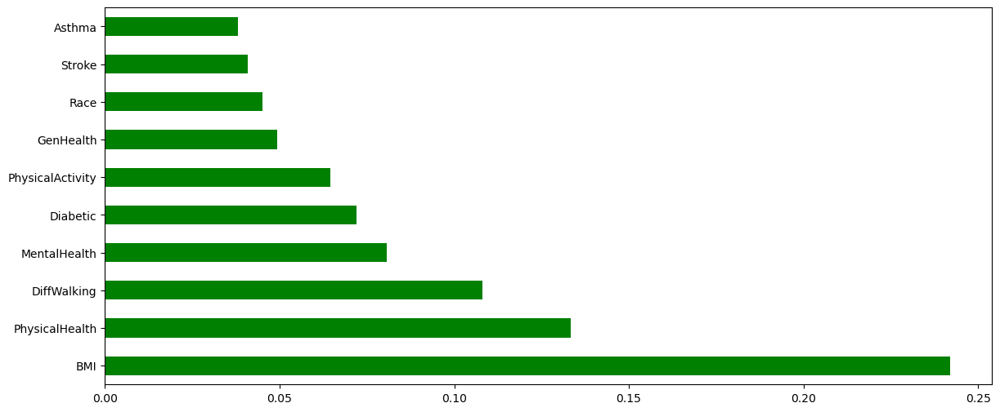

In [43]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(14,6))
features.nlargest(10).plot(kind='barh', color='g')

In [44]:

model2 = SelectKBest(score_func=f_classif)
feature_score = model2.fit(new_x,new_y)
feature_score.scores_


array([3.75440127e+03, 2.03552236e+03, 6.95297966e+02, 4.83533549e+03,
       1.25312036e+04, 6.96957949e+03, 1.36347702e+04, 2.23507248e+02,
       2.12111452e+00, 4.54938853e+03, 9.24225452e+03, 9.11220252e+03,
       1.44917353e+03, 4.00600240e+02, 4.86418830e+03, 3.66576795e+03,
       9.91111023e+02])

In [45]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,3754.401268
1,2035.522364
2,695.297966
3,4835.335493
4,12531.203572
5,6969.579494
6,13634.770216
7,223.507248
8,2.121115
9,4549.388533


In [46]:
col2 = pd.DataFrame(new_x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,BMI
1,Smoking
2,AlcoholDrinking
3,Stroke
4,PhysicalHealth


In [47]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,BMI,3754.401268
1,Smoking,2035.522364
2,AlcoholDrinking,695.297966
3,Stroke,4835.335493
4,PhysicalHealth,12531.203572
5,MentalHealth,6969.579494
6,DiffWalking,13634.770216
7,Sex,223.507248
8,AgeCategory,2.121115
9,Race,4549.388533


In [48]:
new = scores.nlargest(18,'Feature_Scores')
new

,Feature_Names,Feature_Scores
6,DiffWalking,13634.770216
4,PhysicalHealth,12531.203572
10,Diabetic,9242.254520
11,PhysicalActivity,9112.202523
5,MentalHealth,6969.579494
14,Asthma,4864.188299
3,Stroke,4835.335493
9,Race,4549.388533
0,BMI,3754.401268
15,KidneyDisease,3665.767952


Text(0.5, 1.0, 'Feature ranking using SelectKBest classifier')

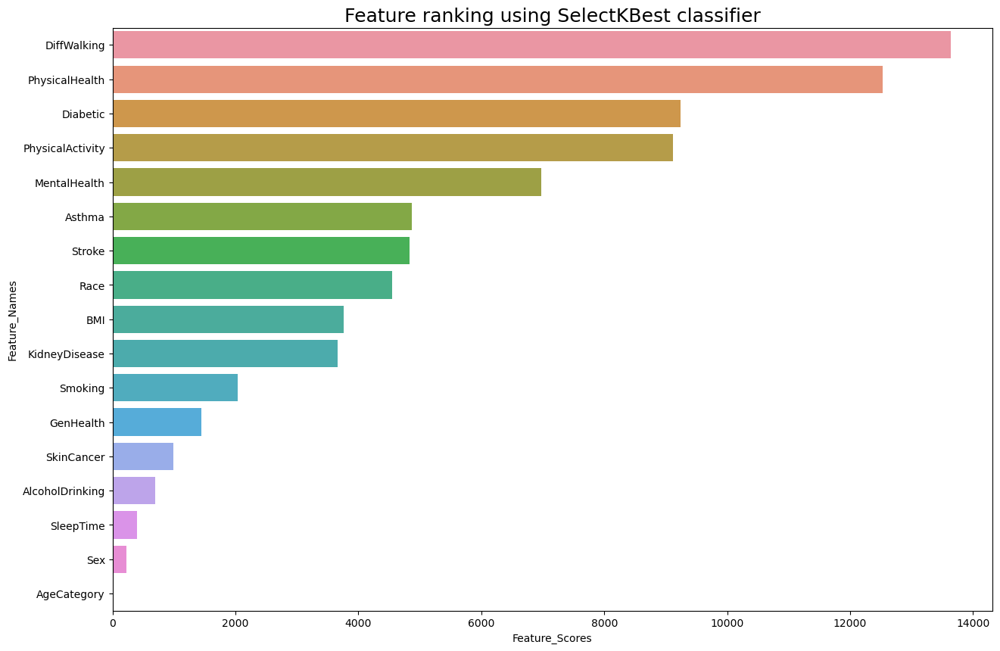

In [49]:
plt.figure(figsize=(15,10))
sns.barplot(x='Feature_Scores',y='Feature_Names',data=new)
plt.title('Feature ranking using SelectKBest classifier',fontsize=18)

PCA

In [50]:
#FEATURE SCALING 

mmx = MinMaxScaler() 
scaled_x = mmx.fit_transform(new_x)
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)
x_pca

array([[-0.6618975 ,  0.02121088,  0.29702415],
       [-0.25531415, -0.64982213, -0.31890448],
       [-0.37867041,  0.74646753, -0.25385805],
       ...,
       [-0.23144898, -0.6596373 , -0.28597491],
       [ 0.30978498,  0.11683606, -0.80248223],
       [ 1.24148225, -0.43433475,  0.48565695]])

In [51]:
features = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3'])
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'pca1=%{marker.color}<br>pca2=%{y}<br>pca3=%{z}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': array([-0.6618975 , -0.25531415, -0.37867041, ..., -0.23144898,  0.30978498,
                                          1.24148225]),
                         'coloraxis': 'coloraxis',
                         'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'scene': 'scene',
              'showlegend': False,
              'type': 'scatter3d',
              'x': array([-0.6618975 , -0.25531415, -0.37867041, ..., -0.23144898,  0.30978498,
                           1.24148225]),
              'y': array([ 0.02121088, -0.64982213,  0.74646753, ..., -0.6596373 ,  0.11683606,
                          -0.43433475]),
              'z': array([ 0.29702415, -0.31890448, -0.25385805, ..., -0.28597491, -0.80248223,
                           0.48565695])}],
    'layout': {'coloraxis': {'colorbar': {'title': {'text': 'pca1'}},
                             'colorscale': [[0.0, '#0d0887'], [0.1111111111111111,
                                            '#46039f'], [0.2222222222222222,
                                            '#7201a8'], [0.3333333333333333,
                                            '#9c179e'], [0.4444444444444444,
                                            '#bd3786'], [0.5555555555555556,
                                            '#d8576b'], [0.6666666666666666,
                                            '#ed7953'], [0.7777777777777778,
                                            '#fb9f3a'], [0.8888888888888888,
                                            '#fdca26'], [1.0, '#f0f921']]},
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'scene': {'domain': {'x': [0.0, 1.0], 'y': [0.0, 1.0]},
                         'xaxis': {'title': {'text': 'pca1'}},
                         'yaxis': {'title': {'text': 'pca2'}},
                         'zaxis': {'title': {'text': 'pca3'}}},
               'template': '...'}
})

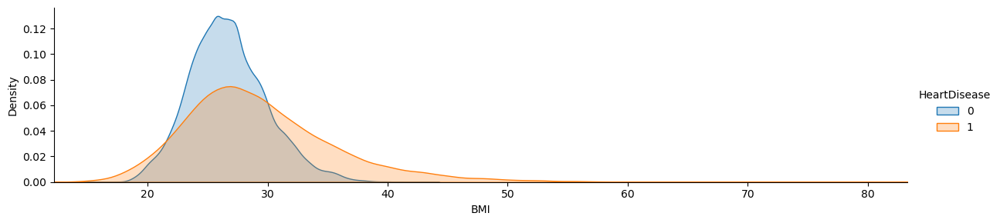

In [52]:
def KDE(x):
    facet=sns.FacetGrid(df4,hue="HeartDisease",aspect=4)
    facet.map(sns.kdeplot,x,shade=True)
    facet.set(xlim=(df4[x].min(),df4[x].max()))
    facet.add_legend()
    plt.show()
KDE('BMI')

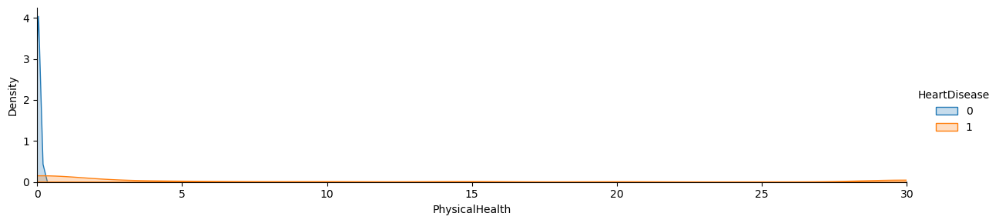

In [53]:
KDE('PhysicalHealth')

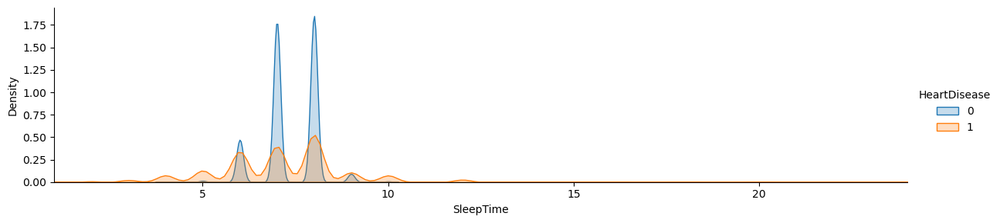

In [54]:
KDE('SleepTime')

In [55]:
df4.corr()

,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease
BMI,1.000000,0.049441,0.014670,0.068767,0.192687,0.145983,0.257873,0.066262,-0.185498,-0.114441,0.293306,-0.210051,-0.031508,-0.067029,0.164275,0.120651,-0.018091,0.253337
Smoking,0.049441,1.000000,0.092053,0.076455,0.133507,0.112300,0.128243,0.101611,0.005786,-0.028858,0.099076,-0.128546,-0.014393,-0.025905,0.067483,0.042515,0.026792,0.189340
AlcoholDrinking,0.014670,0.092053,1.000000,0.024267,0.039746,0.072052,0.026511,0.008041,-0.059917,-0.012962,-0.007564,-0.042995,-0.000983,-0.002374,0.024382,0.000318,0.009680,0.111989
Stroke,0.068767,0.076455,0.024267,1.000000,0.236168,0.171132,0.256971,-0.045099,0.015393,-0.140675,0.169159,-0.172935,-0.067838,-0.018876,0.132583,0.137583,0.043969,0.284882
PhysicalHealth,0.192687,0.133507,0.039746,0.236168,1.000000,0.440993,0.520376,-0.089319,-0.039676,-0.149459,0.264498,-0.365403,-0.082941,-0.105898,0.240992,0.237105,0.053826,0.431588
MentalHealth,0.145983,0.112300,0.072052,0.171132,0.440993,1.000000,0.325887,-0.114732,-0.168178,-0.156602,0.169367,-0.237850,-0.065910,-0.138065,0.209618,0.137120,0.013027,0.336057
DiffWalking,0.257873,0.128243,0.026511,0.256971,0.520376,0.325887,1.000000,-0.134294,0.070244,-0.178967,0.300179,-0.412700,-0.113529,-0.075224,0.245212,0.240233,0.068561,0.446543
Sex,0.066262,0.101611,0.008041,-0.045099,-0.089319,-0.114732,-0.134294,1.000000,-0.114715,0.071277,-0.004047,0.099627,-0.016024,0.018666,-0.100898,-0.046308,0.066207,-0.063767
AgeCategory,-0.185498,0.005786,-0.059917,0.015393,-0.039676,-0.168178,0.070244,-0.114715,1.000000,0.128077,0.034799,-0.061437,0.048086,0.165630,-0.096953,0.046253,0.217923,0.006225
Race,-0.114441,-0.028858,-0.012962,-0.140675,-0.149459,-0.156602,-0.178967,0.071277,0.128077,1.000000,-0.170362,0.143604,0.073850,0.066569,-0.141057,-0.085409,0.079320,-0.276996


<Axes: >

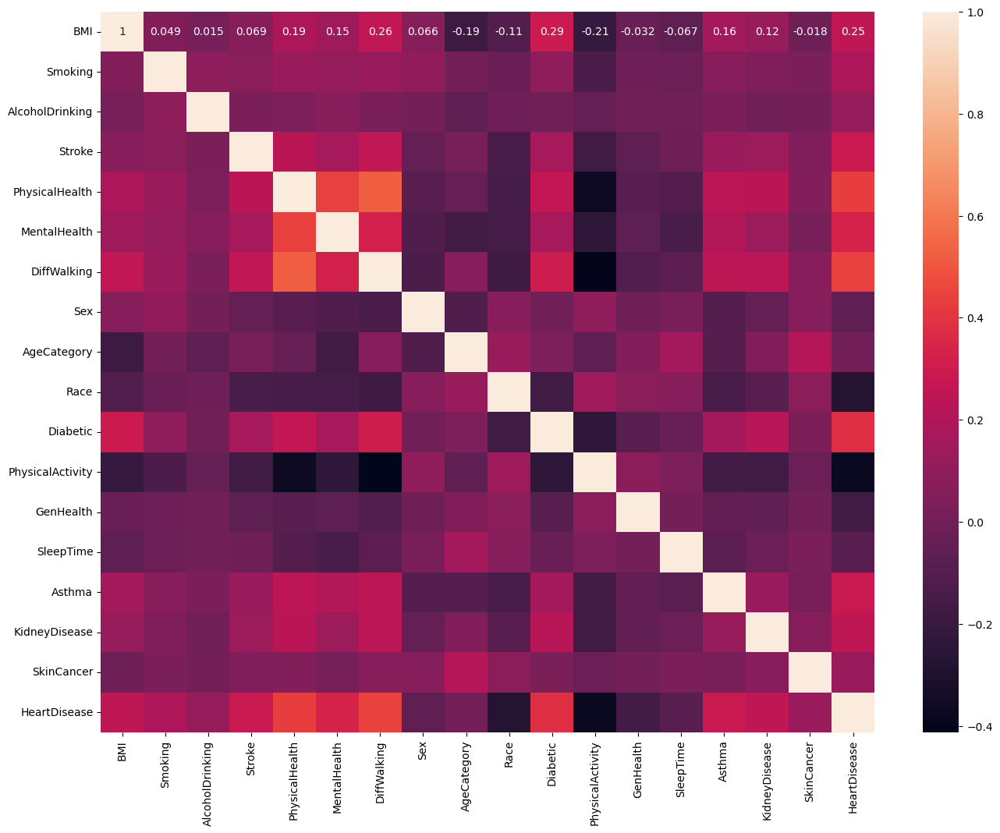

In [56]:
plt.figure(figsize=(16,12))
sns.heatmap(df4.corr(),annot=True)

Split Dataset into Train and Test

In [57]:
from sklearn.metrics import accuracy_score
# Split the data into training, validation and test sets
xtrain, xtest, ytrain, ytest = train_test_split(new_x, new_y, test_size=0.2, random_state=42)
xval, xtest, yval, ytest = train_test_split(xtest, ytest, test_size=0.5, random_state=42)

algorithms = [
    ("Logistic Regression", LogisticRegression()),
    ("KNN Classification", KNeighborsClassifier(n_neighbors=50)),
    ("AdaBoost Classifier", AdaBoostClassifier()),
    ("Decision Tree", DecisionTreeClassifier()),
    ("XGB Classifier", XGBClassifier()),
    ("SVM", SVC(kernel='linear')),
    ("Random Forest", RandomForestClassifier())
]
best_algorithm = None
best_accuracy = 0

# Create lists to store model names and test accuracy
model_name = []
test = []

for name, clf in algorithms:
    clf.fit(xtrain, ytrain)
    y_pred = clf.predict(xval)
    accuracy = accuracy_score(yval, y_pred)
    print(f"{name} - Accuracy: {accuracy}")

    # Save the best algorithm
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_algorithm = (name, clf)

    # Append model name and test accuracy to lists
    model_name.append(name)
    test.append(accuracy)

print(f"\nBest algorithm: {best_algorithm[0]}")




Logistic Regression - Accuracy: 0.8763470319634703
KNN Classification - Accuracy: 0.8421917808219178
AdaBoost Classifier - Accuracy: 0.8922374429223744
Decision Tree - Accuracy: 0.8463926940639269
XGB Classifier - Accuracy: 0.9021004566210046
SVM - Accuracy: 0.8677625570776256
Random Forest - Accuracy: 0.8535159817351599

Best algorithm: XGB Classifier


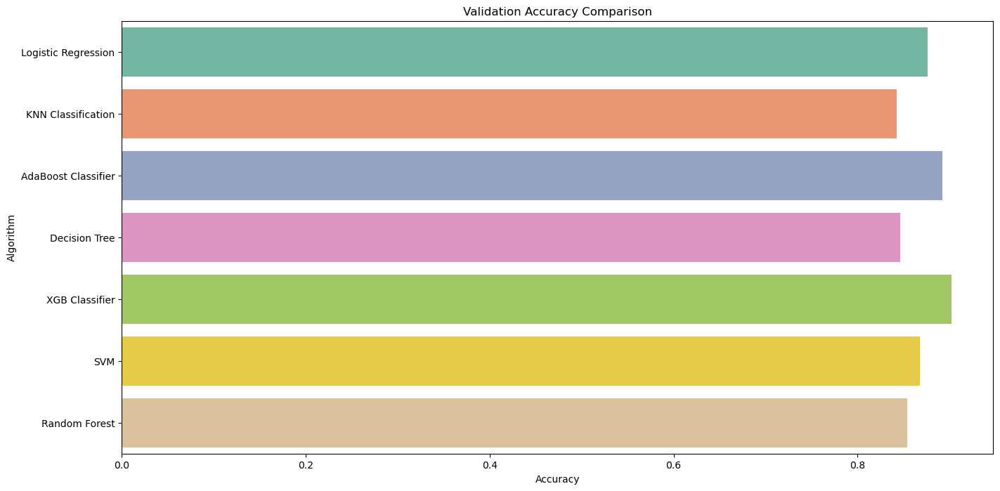

In [58]:
# Create a dataframe with the model names and test accuracy
data = pd.DataFrame({'Algorithm': model_name, 'Accuracy': test})

# Create a figure with the validation accuracy
plt.figure(figsize=(16,8))
plt.title('Validation Accuracy Comparison')
sns.barplot(y="Algorithm", x='Accuracy', data=data, palette='Set2')
plt.show()

In [59]:
# Train the best algorithm on the entire training data
best_algorithm[1].fit(xtrain, ytrain)

# Evaluate the best algorithm on the training data
y_train_pred = best_algorithm[1].predict(xtrain)
train_accuracy = accuracy_score(ytrain, y_train_pred)
print(f"\nTrain Accuracy of Best Model: {train_accuracy}")

# Evaluate the best algorithm on the test data
y_test_pred = best_algorithm[1].predict(xtest)
test_accuracy = accuracy_score(ytest, y_test_pred)
print(f"\nTest Accuracy of Best Model: {test_accuracy}")


Train Accuracy of Best Model: 0.9095807836332085

Test Accuracy of Best Model: 0.8955251141552512


In [60]:

best_algorithm[1].fit(xtrain, ytrain)
y_test_pred = best_algorithm[1].predict(xtest)
print(f"\nReport for {best_algorithm[0]}")
print(classification_report(ytest, y_test_pred))


Report for XGB Classifier
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      2704
           1       0.94      0.85      0.89      2771

    accuracy                           0.90      5475
   macro avg       0.90      0.90      0.90      5475
weighted avg       0.90      0.90      0.90      5475



In [61]:
 y_test_pred = best_algorithm[1].predict(xtest)
print("Predicted values: ", y_test_pred)

Predicted values:  [1 1 0 ... 0 1 0]


In [62]:

correct_predictions = sum(y_test_pred == ytest)
percentage_correct = correct_predictions / len(ytest) * 100
print(f"Percentage of correct predictions: {percentage_correct:.2f}%")
class_counts = Counter(ytest)
class_percentages = {k: v/len(ytest)*100 for k,v in class_counts.items()}
print(f"Percentage of predictions for each class:\n{class_percentages}")

Percentage of correct predictions: 89.55%
Percentage of predictions for each class:
{1: 50.61187214611872, 0: 49.38812785388128}


In [63]:


# Generate confusion matrix for the best algorithm on the test set
y_test_pred = best_algorithm[1].predict(xtest)
conf_matrix = confusion_matrix(ytest, y_test_pred)

# Print the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[2549  155]
 [ 417 2354]]


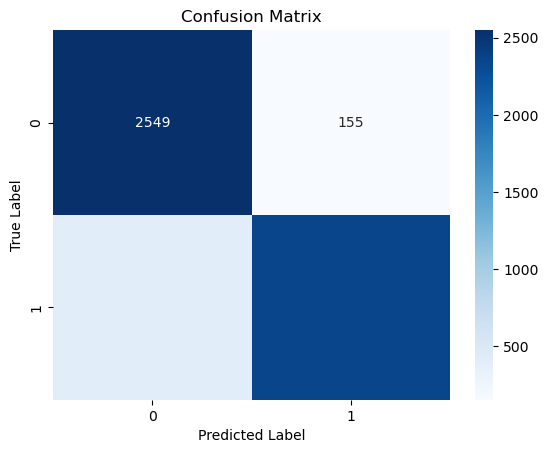

In [64]:

# Generate confusion matrix for the best algorithm on the test set
y_test_pred = best_algorithm[1].predict(xtest)
conf_matrix = confusion_matrix(ytest, y_test_pred)

# Create a heatmap of the confusion matrix
sns.heatmap(conf_matrix, annot=True, fmt=".0f", cmap="Blues")

# Add labels and title
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

# Show the plot
plt.show()

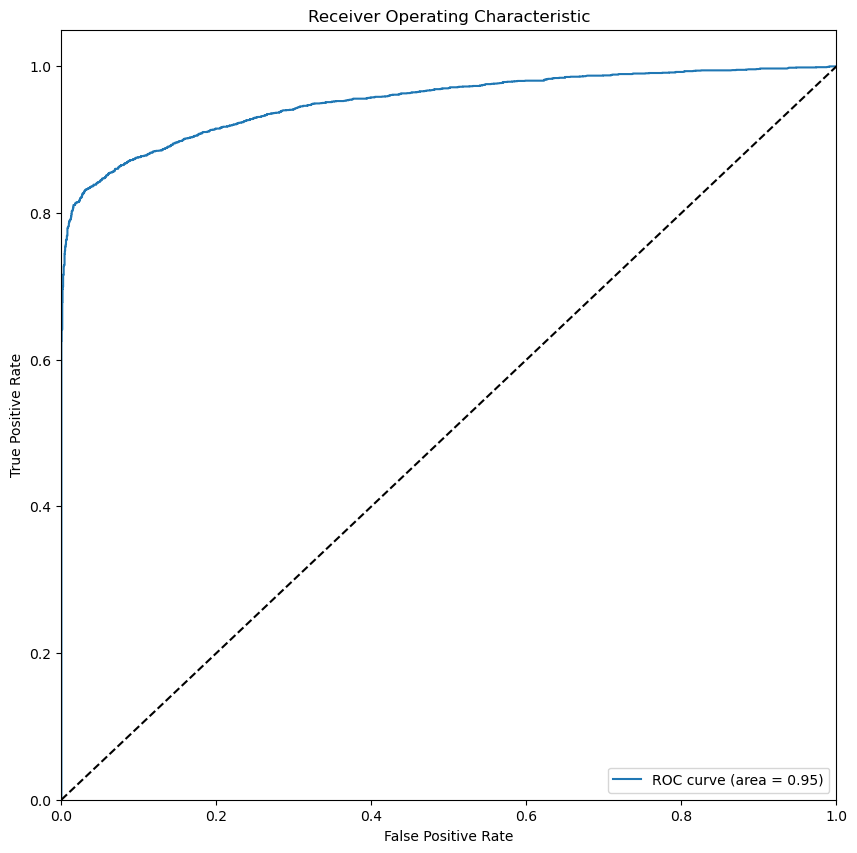

R2 score: 0.5820378646975544
MSE: 0.10447488584474886
MAE: 0.10447488584474886


In [83]:

from sklearn.metrics import mean_squared_error, mean_absolute_error
# Compute ROC curve and AUC for the best algorithm
fpr, tpr, thresholds = roc_curve(ytest, best_algorithm[1].predict_proba(xtest)[:, 1])
roc_auc = auc(fpr, tpr)

# Compute R2 score for the best algorithm
y_test_pred = best_algorithm[1].predict(xtest)
r2 = r2_score(ytest, y_test_pred)
MSE = mean_squared_error(ytest, y_test_pred)
MAE = mean_absolute_error(ytest, y_test_pred)
# Plot ROC curve
plt.figure(figsize=(10, 10))
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print R2 score
print(f"R2 score: {r2}")
print(f"MSE: {MSE}")
print(f"MAE: {MAE}")